In [2]:
## This version of 1D greedy algorithm, the numerical quadrature used for assembling the linear system is consistent with 
## the quadrature used for the argmax subproblem.
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import time
import sys
from scipy.sparse import linalg
from pathlib import Path
if torch.cuda.is_available():  
    device = "cuda" 
else:  
    device = "cpu" 

pi = torch.tensor(np.pi,dtype=torch.float64)
torch.set_default_dtype(torch.float64)

class model(nn.Module):
    """ ReLU k shallow neural network
    Parameters: 
    input size: input dimension
    hidden_size1 : number of hidden layers 
    num_classes: output classes 
    k: degree of relu functions
    """
    def __init__(self, input_size, hidden_size1, num_classes,k = 1):
        super().__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.fc2 = nn.Linear(hidden_size1, num_classes,bias = False)
        self.k = k 
    def forward(self, x):
        u1 = self.fc2(F.relu(self.fc1(x))**self.k)
        return u1

class model_tanh(nn.Module):
    """ ReLU k shallow neural network
    Parameters: 
    input size: input dimension
    hidden_size1 : number of hidden layers 
    num_classes: output classes 
    k: degree of relu functions
    """
    def __init__(self, input_size, hidden_size1, num_classes):
        super().__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.fc2 = nn.Linear(hidden_size1, num_classes,bias = False)
    def forward(self, x):
        u1 = self.fc2(torch.tanh(self.fc1(x)))
        return u1

class model_cosine(nn.Module):
    """ ReLU k shallow neural network
    Parameters: 
    input size: input dimension
    hidden_size1 : number of hidden layers 
    num_classes: output classes 
    k: degree of relu functions
    """
    def __init__(self, input_size, hidden_size1, num_classes):
        super().__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1, bias = False)
        self.fc2 = nn.Linear(hidden_size1, num_classes,bias = False)
    def forward(self, x):
        u1 = self.fc2(torch.cos(2 * pi * self.fc1(x)))
        return u1

In [3]:
def PiecewiseGQ1D_weights_points(x_l,x_r,Nx, order):
    """ Output the coeffients and weights for piecewise Gauss Quadrature 
    Parameters
    ----------
    x_l : float 
    left endpoint of an interval 
    
    x_r: float
    right endpoint of an interval 
    
    integration_intervals: int
    number of subintervals for integration
    
    Returns
    -------
    coef1_expand
    
    gw_expand
    
    integration_points
    """
    x,w = np.polynomial.legendre.leggauss(order)
    gx = torch.tensor(x).to(device)
    gx = gx.view(1,-1) # row vector 
    gw = torch.tensor(w).to(device)    
    gw = gw.view(-1,1) # Column vector 
    nodes = torch.linspace(x_l,x_r,Nx+1).view(-1,1).to(device) 
    coef1 = ((nodes[1:,:] - nodes[:-1,:])/2) # n by 1  
    coef2 = ((nodes[1:,:] + nodes[:-1,:])/2) # n by 1  
    coef2_expand = coef2.expand(-1,gx.size(1)) # Expand to n by p shape, -1: keep the first dimension n , expand the 2nd dim (columns)
    integration_points = coef1@gx + coef2_expand
    integration_points = integration_points.flatten().view(-1,1) # Make it a column vector
    gw_expand = torch.tile(gw,(Nx,1)) # rows: n copies of current tensor, columns: 1 copy, no change
    # Modify coef1 to be compatible with func_values
    coef1_expand = coef1.expand(coef1.size(0),gx.size(1))    
    coef1_expand = coef1_expand.flatten().view(-1,1)

    return coef1_expand.to(device)*gw_expand.to(device), integration_points.to(device)


def PiecewiseGQ2D_weights_points(Nx, order,l_point = (-1,-1), r_point = (1,1)): 
    """ A slight modification of PiecewiseGQ2D function that only needs the weights and integration points.
    Parameters. 
    Only works for the square domain centered at origin or with the left point at origin.
    ----------
    Nx: int 
        number of intervals along the dimension. No Ny, assume Nx = Ny
    order: int 
        order of the Gauss Quadrature
    l_point: (x1,x2)
        left bottom point of the rectangular domain 
    r_point: (x1,x2)
        right top point of the rectangular domain 

    Returns
    -------
    long_weights: torch.tensor
    integration_points: torch.tensor
    """
    assert Nx%2==0, "Nx should be even" 

    h1 = (r_point[0] - l_point[0])/Nx
    h2 = (r_point[1] - l_point[1])/Nx 

    x, w = np.polynomial.legendre.leggauss(order)
    gauss_pts = np.array(np.meshgrid(x,x,indexing='ij')).reshape(2,-1).T
    weights =  (w*w[:,None]).ravel()

    gauss_pts =torch.tensor(gauss_pts)
    weights = torch.tensor(weights)

    long_weights =  torch.tile(weights,(Nx**2,1))
    long_weights = long_weights.reshape(-1,1)
    long_weights = long_weights * (h1/2) * (h2/2) # scale the weights  
    integration_points = torch.tile(gauss_pts,(Nx**2,1))
    scale_factor = h1/2 
    integration_points = scale_factor * integration_points

    offset = 0 if l_point[0] == 0 else 1 

    index = np.arange(1,Nx+1)- (Nx/2)*offset - 0.5 
    ordered_pairs = np.array(np.meshgrid(index,index,indexing='ij'))
    ordered_pairs = ordered_pairs.reshape(2,-1).T
    ordered_pairs = torch.tensor(ordered_pairs)
    ordered_pairs = torch.tile(ordered_pairs, (1,order**2)) # number of GQ points
    ordered_pairs =  ordered_pairs.reshape(-1,2)

    translation = ordered_pairs*h1
    integration_points = integration_points + translation 
    return long_weights, integration_points

def PiecewiseGQ3D_weights_points(Nx, order,bl = [-1,-1,-1],ur = [1,1,1]): 
    """ A slight modification of PiecewiseGQ2D function that only needs the weights and integration points.
    Parameters
    ----------

    Nx: int 
        number of intervals along the dimension. No Ny, assume Nx = Ny
    order: int 
        order of the Gauss Quadrature

    Returns
    -------
    long_weights: torch.tensor
    integration_points: torch.tensor
    """

    """
    Parameters
    ----------
    target : 
        Target function 
    Nx: int 
        number of intervals along the dimension. No Ny, assume Nx = Ny
    order: int 
        order of the Gauss Quadrature
    """

    # print("order: ",order )
    x, w = np.polynomial.legendre.leggauss(order)
    gauss_pts = np.array(np.meshgrid(x,x,x,indexing='ij')).reshape(3,-1).T
    weight_list = np.array(np.meshgrid(w,w,w,indexing='ij'))
    weights =   (weight_list[0]*weight_list[1]*weight_list[2]).ravel() 

    gauss_pts =torch.tensor(gauss_pts)
    weights = torch.tensor(weights)

    # h = 1/Nx # 100 intervals 
    h = (ur[0]- bl[0])/Nx # 100 intervals 
    long_weights =  torch.tile(weights,(Nx**3,1))
    long_weights = long_weights.reshape(-1,1)
    long_weights = long_weights * h**3 /8 

    integration_points = torch.tile(gauss_pts,(Nx**3,1))
    # print("shape of integration_points", integration_points.size())
    scale_factor = h/2 
    integration_points = scale_factor * integration_points

    # index = np.arange(1,Nx+1)-0.5
    index = np.arange(0,Nx)  
    ordered_pairs = np.array(np.meshgrid(index,index,index,indexing='ij'))
    ordered_pairs = ordered_pairs.reshape(3,-1).T

    # print(ordered_pairs)
    # print()
    ordered_pairs = torch.tensor(ordered_pairs)
    # print(ordered_pairs.size())
    ordered_pairs = torch.tile(ordered_pairs, (1,order**3)) # number of GQ points
    # print(ordered_pairs)

    ordered_pairs =  ordered_pairs.reshape(-1,3)
    # print(ordered_pairs)
    # translation = ordered_pairs*h 
    translation = ordered_pairs*h + (torch.tensor(bl) + h/2) 
    # print(translation)

    integration_points = integration_points + translation 

    return long_weights.to(device), integration_points.to(device)


def minimize_linear_layer_explicit_assemble(model,target,weights, integration_points,solver="direct",activation = 'tanh'):
    """
    1. assemble matrix and rhs vector 
    2. solve the linear system and return the solution 
    """
    # Nx = 1024
    # order = 5
    # weights, integration_points = PiecewiseGQ1D_weights_points(-1,1,Nx,order) 

    # start_time = time.time()
    w = model.fc1.weight.data
    if activation == 'cos':
        basis_value_col = torch.cos(2*pi* (integration_points @ w.t()) ) # activation function dependent 
    elif activation == 'tanh':
        bias = model.fc1.bias.data 
        basis_value_col = torch.tanh(integration_points @ w.t() + bias) # activation function dependent 
    weighted_basis_value_col = basis_value_col * weights
    jac = weighted_basis_value_col.t() @ basis_value_col 
    # print("assembling the matrix time taken: ", time.time()-start_time) 
    rhs = weighted_basis_value_col.t() @ target(integration_points) 

    # print("using: ",solver, end = " ")
    if solver == "cg": 
        sol, exit_code = linalg.cg(np.array(jac.detach().cpu()),np.array(rhs.detach().cpu()),tol=1e-12)
        sol = torch.tensor(sol).view(1,-1)
    elif solver == "direct": 
#         sol = np.linalg.inv( np.array(jac.detach().cpu()) )@np.array(rhs.detach().cpu())
        sol = (torch.linalg.solve( jac.detach(), rhs.detach())).view(1,-1)
    elif solver == "ls":
        sol = (torch.linalg.lstsq(jac.detach().cpu(),rhs.detach().cpu(),driver='gelsd').solution).view(1,-1)
        # sol = (torch.linalg.lstsq(jac.detach(),rhs.detach()).solution).view(1,-1) # gpu/cpu, driver = 'gels', cannot solve singular
    return sol 

def plot_solution_modified(r1,r2,model,x_test,u_true,name=None): 
    # Plot function: test results 
    u_model_cpu = model(x_test).cpu().detach()
    
    w = model.fc1.weight.data.squeeze()
    b = model.fc1.bias.data.squeeze()
    x_model_pt = (-b/w).view(-1,1)
    u_model_pt = model(x_model_pt).cpu().detach()
    plt.figure(dpi = 100)
    plt.plot(x_test.cpu(),u_model_cpu,'-.',label = "nn function")
    plt.plot(x_test.cpu(),u_true.cpu(),label = "true")
#     plt.plot(x_model_pt,u_model_pt,'.r')
    if name!=None: 
        plt.title(name)
    plt.legend()
    plt.show()

def initialize_uniform(my_model,target = None):
    """
    mutator function. input: my_model
    """
    #FEM initialization
    neuron_number = my_model.fc1.bias.size(0)
    h = 2*1/neuron_number
    #wi(x-x_i)
    wi = torch.full((neuron_number,1),1/h)
    bi = torch.linspace(-1,1,neuron_number + 1)[:-1].view(neuron_number,1) #x_i
    bi = -(wi*bi).view(neuron_number)
    my_model.fc1.weight.data = wi # somehow this local variable is not destroyed
    my_model.fc1.bias.data = bi
    return my_model 
    
def initialize_w_b_uniform(my_model,R_m): # mostly used in ELM 
    nn.init.uniform_(my_model.fc1.weight, a = -R_m, b = R_m)
    nn.init.uniform_(my_model.fc1.bias, a = -R_m, b = R_m)
    return my_model 


def initialize_w_sphere_b_uniform(my_model,R_m): 
    # nn.init.uniform_(my_model.fc1.weight, a = -R_m, b = R_m)
    # initialize the weights to be on the sphere 
    # decide dimension of the sphere 
    w = my_model.fc1.weight
    b = my_model.fc1.bias
    out_feats, in_feats = w.shape
    device = w.device
    # dtype = w.dtype
    with torch.no_grad():
        if in_feats == 1:  #n by 1 
            ones = torch.ones(out_feats,1).to(device)
            w[:,:]=  ones[:,:]
        elif in_feats == 2: # omega uniform grid on S^1
            theta = np.linspace(0,2*pi,out_feats,endpoint=False) 
            theta = torch.tensor(theta).to(device)
            w[:, 0] = theta.cos()
            w[:, 1] = theta.sin()
        elif in_feats == 3:# omega uniform grid on S^2 

            indices = torch.arange(0, out_feats, dtype=torch.float) + 0.5
            phi = torch.acos(1 - 2*indices/out_feats)
            theta = pi * (1 + 5**0.5) * indices
            x = torch.sin(phi) * torch.cos(theta)
            y = torch.sin(phi) * torch.sin(theta)
            z = torch.cos(phi)
            points = torch.stack((x, y, z), dim=1)
            w[:,:] = points[:,0:3]

        elif in_feats >= 4: 
            nn.init.normal_(w, mean = 0, std = 1)
            w[:,:] = w[:,:] / torch.norm(w,dim=1).view(-1,1) 

            
        biases = torch.linspace(-R_m,R_m,my_model.fc1.bias.size(0)) # 
        my_model.fc1.bias.data[:] = biases[:]

    return my_model

def initialize_w_b_sphere(my_model,R_m):
    # generate a uniform grid on S^2 
    neuron_nums = my_model.fc1.bias.size(0) 
    out_feats, in_feats = my_model.fc1.weight.shape 
    if in_feats == 2: 
        indices = torch.arange(0, neuron_nums, dtype=torch.float) + 0.5
        phi = torch.acos(1 - 2*indices/neuron_nums)
        theta = pi * (1 + 5**0.5) * indices
        x = torch.sin(phi) * torch.cos(theta)
        y = torch.sin(phi) * torch.sin(theta)
        z = torch.cos(phi)

        points = torch.stack((x, y, z), dim=1)
        my_model.fc1.weight.data[:,:] = points[:,0:2] * R_m
        my_model.fc1.bias.data[:] = points[:,2] * R_m 
    # elif in_feats == 1:
    #     theta = torch.linspace(0, 2*pi, neuron_nums+1)[:-1]
    #     w1 = torch.cos(theta) * R_m
    #     b = torch.sin(theta) * R_m
    #     my_model.fc1.weight.data[:,0] = w1[:]
    #     my_model.fc1.bias.data[:] = b[:]
    else: 
        w_b = torch.randn(neuron_nums,in_feats + 1) 
        w_b = w_b / torch.norm(w_b,dim=1).view(-1,1) 
        w_b = w_b * R_m 
        my_model.fc1.weight.data[:,:] = w_b[:,:-1] 
        my_model.fc1.bias.data[:] = w_b[:,-1] 
    return my_model 



def initialize_w_b_petrushev(my_model,R_m):
    w = my_model.fc1.weight
    b = my_model.fc1.bias
    out_feats, in_feats = w.shape
    device = w.device
    n1 = math.ceil(out_feats**((in_feats - 1)/in_feats))
    n2 = math.ceil(out_feats**(1/in_feats))
    with torch.no_grad():
        if in_feats == 1:  #n by 1 
            weights = torch.ones(n1,1).to(device)
            weights[:,0] = torch.linspace(-R_m,R_m,n1) 
        elif in_feats == 2:
            weights = torch.zeros(n1,2).to(device)
            theta = np.linspace(0,2*pi,n1,endpoint=False) 
            theta = torch.tensor(theta).to(device)
            weights[:, 0] = theta.cos()
            weights[:, 1] = theta.sin() 
            #form a tensor product of weights and biases
        elif in_feats == 3: 
            indices = torch.arange(0, n1, dtype=torch.float) + 0.5
            phi = torch.acos(1 - 2*indices/n1)
            theta = pi * (1 + 5**0.5) * indices
            x = torch.sin(phi) * torch.cos(theta)
            y = torch.sin(phi) * torch.sin(theta)
            z = torch.cos(phi)
            weights = torch.stack((x, y, z), dim=1)
        elif in_feats >= 4: 
            # nn.init.normal_(w, mean = 0, std = 1)
            weights = torch.randn(n1, in_feats).to(device) 
            weights = weights / torch.norm(weights,dim=1).view(-1,1) 

        # form a tensor product of weights and biases 
        weights = torch.tile(weights, (1,n2)).reshape(-1,in_feats) 
        # print("weights shape: ", weights.shape) 
        # print("nn w shape: ", w.shape)
        my_model = model_tanh(in_feats, n1*n2, 1).to(device) 
        biases = torch.linspace(-R_m,R_m,n2)
        biases = torch.tensor(biases).to(device) 
        biases = torch.tile(biases, (n1,1)).reshape(-1) 
        # w[:,:] = weights[:out_feats,:] 
        my_model.fc1.weight.data[:,:] = weights[:,:]
        my_model.fc1.bias.data[:] = biases[:] 

    return my_model 

def initialize_normal(my_model, mu, sigma):
    nn.init.normal_(my_model.fc1.weight, mean = mu, std = sigma)
    return my_model

def set_linear_layer_to_fixed_weights(my_model):
    neuron_num = my_model.fc1.weight.size(0)
    coefs = torch.ones(neuron_num) * 1/neuron_num 
    my_model.fc2.weight.data[0,:] = coefs[:]  
    return my_model

def plot_err_loglog(neuron_num_arr,mean_err_l2_arr, legend1, title): 

    plt.figure(dpi = 400) 
    plt.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1) 

    # Taking the logarithm of both M and errors
    log_M = np.log(neuron_num_arr) 
    log_errors = np.log(mean_err_l2_arr)
    # Perform linear regression to find the slope and intercept of the line
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    # Create a function for the line of best fit

    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr) 

    plt.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ))
    plt.yscale('log') 
    plt.xscale('log') 
    plt.legend() 
    plt.ylabel("$L^2$ error")
    plt.xlabel("Number of neurons n")
    plt.title(title) 
    plt.show() 

### test quadrature method 

## Tanh activated NN
- predetermined neurons 
 

## 1D experiment 

In [4]:
def assemble_least_square_linear_system_quadrature(model,rhs, integration_weights,integration_points): 
    """ Assemble the least square linear system, D: design matrix, b right hand side """
    in_feat, out_feat = model.fc1.weight.shape 
    W = model.fc1.weight.data  # shape: (M, d+1)
    b = model.fc1.bias.data  # shape: (M,)
    Z = integration_points@ W.t() + b  
    D = torch.tanh(Z)  * integration_weights  
    b_rhs = rhs(integration_points) * integration_weights 
    return D,b_rhs

def Monte_Carlo_dDim_weights_points(M, d,bl = -1,ur = 1):
    # Samples N points uniformly in Ω at t = 0 (initial condition)
    length = ur - bl
    vol = length ** d
    integration_points = torch.empty(M, d).uniform_(bl, ur)
    # t = torch.zeros(N, 1)
    # return torch.cat([X, t], dim=1).to(device)
    weights = torch.ones(M,1).to(device)/M * vol 
    return weights.to(device), integration_points.to(device)  

def MonteCarlo_Sobol_dDim_weights_points(M ,d = 4,bl = -1,ur = 1):
    
    length = ur - bl
    vol = length ** d 
    Sob_integral = torch.quasirandom.SobolEngine(dimension =d, scramble= False, seed=None) 
    integration_points = Sob_integral.draw(M).double() 
    integration_points = integration_points.to(device) * (length) - length/2
    weights = torch.ones(M,1).to(device)/M * vol 
    return weights.to(device), integration_points.to(device) 

In [5]:
def rescale_mat_rhs(A,f):
    c = 100.0
    for i in range(len(A)):
        ## change 
        max_a = abs(A[i,:]).max()
        max_b = A[i,:].max()
        if max_a != max_b: 
            ratio = -c/max_a
            A[i,:] = A[i,:]*ratio
            f[i] = f[i]*ratio
        else: 
            ratio = c/max_a
            A[i,:] = A[i,:]*ratio
            f[i] = f[i]*ratio
    return A,f 

### Gauss quadrature data points

In [6]:
Q = 1024 
collocation_points = torch.linspace(-1,1,Q).view(-1,1)
collocation_weights = torch.ones(Q).view(-1,1)

collocation_points = torch.linspace(-1,1,10).view(-1,1)

In [7]:
import scipy


In [ ]:
def target(x):
    return torch.cos( 16 * pi * x)

# def target(x):
#     sigma = 0.15 
#     m = 8
#     return np.exp(-(x-0.5)**2/(2*sigma**2)) * np.cos(2*np.pi*m*x) # Gabor function

# for Nx in [4096]:  
integration_weights, integration_points = PiecewiseGQ1D_weights_points(-1,1,Nx = 1024, order = 2)
integration_weights_test, integration_points_test = PiecewiseGQ1D_weights_points(-1,1,Nx = 1024, order = 2)
print("integration_weights shape: ", integration_weights.shape)
print("integration_points shape: ", integration_points.shape)  

# collocation points and weights 
Q = 3200 
collocation_points = torch.linspace(-1,1,Q).view(-1,1)
collocation_weights = torch.ones(Q).view(-1,1)
 
save = False 

R_m_list = [2,4,8,16]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(3,10)]) 
    # neuron_num_arr= np.array([i for i in range(1,41,2)]) 
    for n in neuron_num_arr : 
        trial_num = 1  
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            # my_model = model_cosine(1, n, 1).to(device) 
            my_model = model_tanh(1, n, 1).to(device) 
            my_model = initialize_w_b_uniform(my_model,R_m) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_sphere(my_model,R_m)
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,collocation_weights, collocation_points )
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points) 
            target_values = target(integration_points) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("ave_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
    
    legend1 = "Scheme 1: $ Uniform([-{}, {}])$".format(R_m,R_m)
    title = "Scheme 1: $Uniform([-{}, {}])$".format(R_m,R_m) 
    plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

integration_weights shape:  torch.Size([2048, 1])
integration_points shape:  torch.Size([2048, 1])


<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

### sphere initialization

In [142]:
def target(x):
    return torch.sin(2 * pi * x) + torch.cos( 16 * pi * x) + torch.sin( 16 * pi * x) + 0.5 * torch.sin(32 * pi * x)

# def target(x):
#     sigma = 0.15 
#     m = 8
#     return np.exp(-(x)**2/(2*sigma**2)) * np.cos(2*np.pi*m*x) # Gabor function

# for Nx in [4096]:  
integration_weights, integration_points = PiecewiseGQ1D_weights_points(-1,1,Nx = 1024, order = 2)
integration_weights_test, integration_points_test = PiecewiseGQ1D_weights_points(-1,1,Nx = 1024, order = 2)
print("integration_weights shape: ", integration_weights.shape)
print("integration_points shape: ", integration_points.shape)  

# collocation points and weights 
Q = 3200 
collocation_points = torch.linspace(-1,1,Q).view(-1,1)
collocation_weights = torch.ones(Q).view(-1,1)
 
save = False 

R_m_list = [4,8,16,32]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(3,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,41,2)]) 
    for n in neuron_num_arr : 
        trial_num = 1  
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            # my_model = model_cosine(1, n, 1).to(device) 
            my_model = model_tanh(1, n, 1).to(device) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_sphere(my_model,R_m)
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,collocation_weights, collocation_points )
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points) 
            target_values = target(integration_points) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("ave_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)

    legend1 = "Scheme 1: $ Uniform([-{}, {}])$".format(R_m,R_m)
    title = "Scheme 1: $Uniform([-{}, {}])$".format(R_m,R_m) 
    plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()


integration_weights shape:  torch.Size([2048, 1])
integration_points shape:  torch.Size([2048, 1])


<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

<Figure size 2560x1920 with 0 Axes>

In [95]:
def target(x):
    sigma = 0.15 
    m = 8
    return np.exp(-x**2/(2*sigma**2)) * np.cos(2*np.pi*m*x) # Gabor function

# def target(x):
#     return torch.sin( 4 *pi * x)

# for Nx in [4096]:  
integration_weights, integration_points = PiecewiseGQ1D_weights_points(-1,1,Nx = 1024, order = 5)
integration_weights_test, integration_points_test = PiecewiseGQ1D_weights_points(-1,1,Nx = 2048, order = 5)
print("integration_weights shape: ", integration_weights.shape)
print("integration_points shape: ", integration_points.shape)  

# collocation points and weights 
Q = 3200 
collocation_points = torch.linspace(-1,1,Q).view(-1,1)
collocation_weights = torch.ones(Q).view(-1,1)

save = False

R_m_list = [0.5, 1, 1.5,2] # ,2.5,3,4
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(3,9)]) 
    # neuron_num_arr= np.array([i for i in range(1,82,5)]) 
    for n in neuron_num_arr : 
        trial_num = 1 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            # my_model = model_cosine(1, n, 1).to(device) 
            my_model = model_tanh(1, n, 1).to(device) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_petrushev(my_model,R_m)
            # my_model = initialize_w_b_sphere(my_model,R_m)
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,collocation_weights, collocation_points)
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points) 
            target_values = target(integration_points) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("ave_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
    legend1 = "Scheme 2: $(\omega_i,b_i) \sim U(-{}, {})$".format(R_m,R_m)
    title = "Scheme 2: $U(-{}, {})$".format(R_m,R_m) 

    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

integration_weights shape:  torch.Size([5120, 1])
integration_points shape:  torch.Size([5120, 1])


/var/folders/45/p1_q2drx75983lk7ph_1gx6mhpr5_w/T/ipykernel_10085/4136271756.py:340: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  biases = torch.tensor(biases).to(device)
/var/folders/45/p1_q2drx75983lk7ph_1gx6mhpr5_w/T/ipykernel_10085/1597100060.py:4: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return np.exp(-x**2/(2*sigma**2)) * np.cos(2*np.pi*m*x) # Gabor function


### Monte Carlo data points

integration_weights shape:  torch.Size([1024, 1])
integration_points shape:  torch.Size([1024, 1])


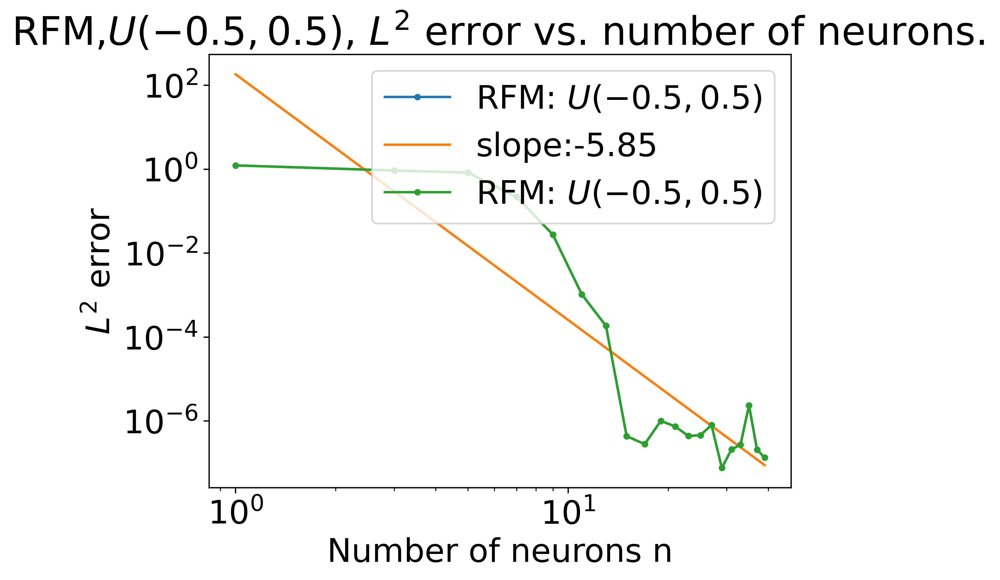

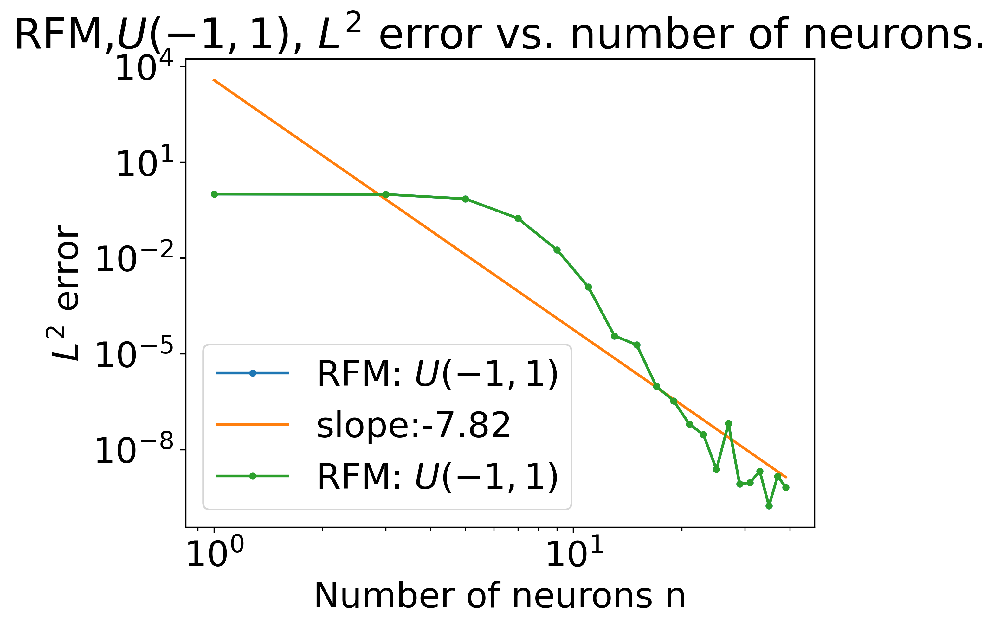

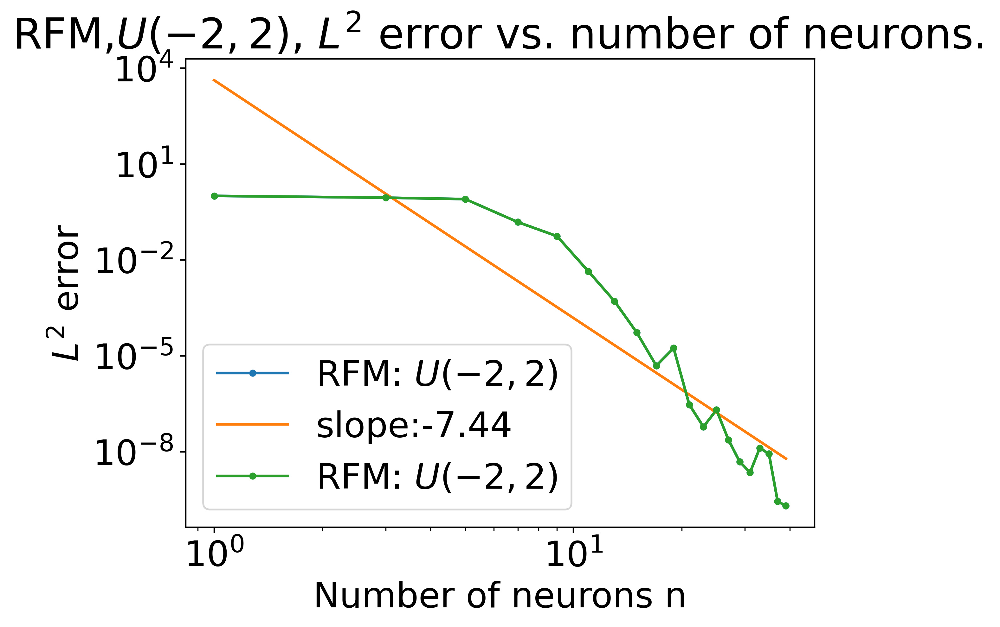

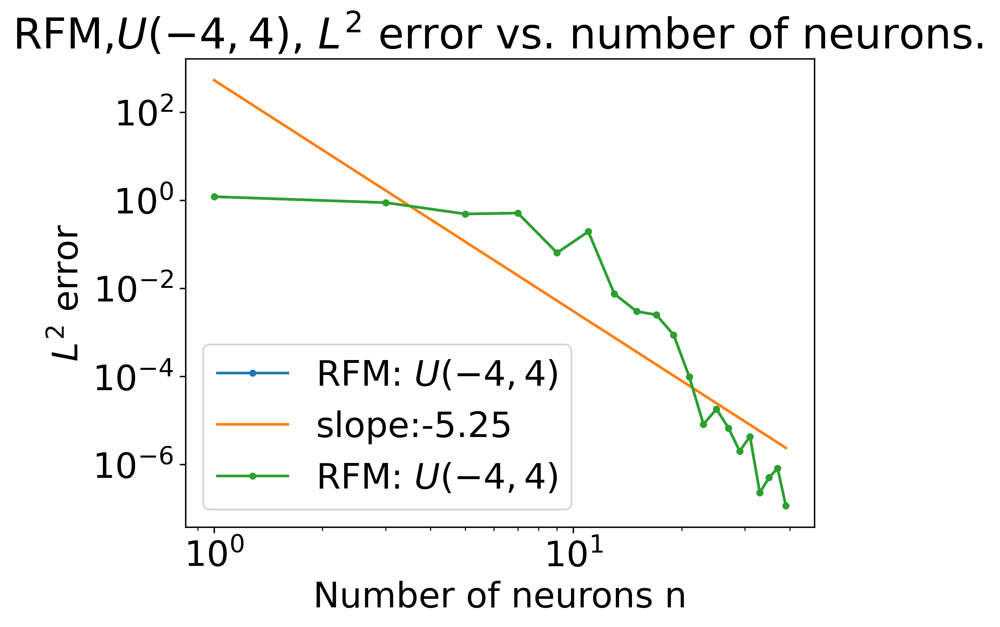

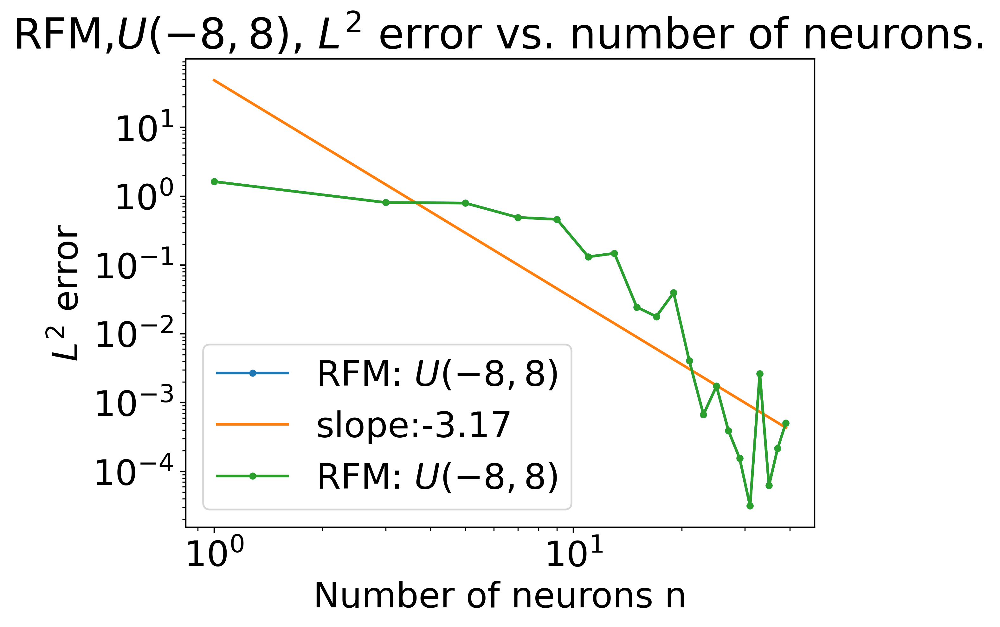

In [75]:
def target(x):
    return torch.sin(2* pi * x)
# for Nx in [4096]:  
# integration_weights, integration_points = PiecewiseGQ1D_weights_points(-1,1,Nx = 1024, order = 5)
integration_weights, integration_points = Monte_Carlo_dDim_weights_points(1024, 1, -1, 1) 
integration_weights_test, integration_points_test = PiecewiseGQ1D_weights_points(-1,1,Nx = 2048, order = 2)
print("integration_weights shape: ", integration_weights.shape)
print("integration_points shape: ", integration_points.shape)  
save = True
for R_m in [0.5,1,2,4,8]: #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    # neuron_num_arr= np.array([2**i for i in range(3,9)]) 
    neuron_num_arr= np.array([i for i in range(1,41,2)]) 
    for n in neuron_num_arr : 
        trial_num = 1 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            # my_model = model_cosine(1, n, 1).to(device) 
            my_model = model_tanh(1, n, 1).to(device) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_petrushev(my_model,R_m)
            my_model = initialize_w_b_sphere(my_model,R_m)
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            # print("shape of D: ", D.shape)
            # print("shape of b_rhs: ", b_rhs.shape) 
            # rescaling
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            # print("sol shape: ", sol.shape) 
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points) 
            target_values = target(integration_points) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("ave_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
    legend1 = "RFM: $U(-{}, {})$".format(R_m,R_m)
    title = "RFM,$U(-{}, {})$, $L^2$ error vs. number of neurons. ".format(R_m,R_m) 
    # plot_err_loglog(neuron_num_arr,mean_err_l2_arr, legend1, title) 
    ## plot semi-log
    plt.figure(dpi = 400)
    plt.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    plt.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ))
    # Taking the logarithm of both M and errors
    plt.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1)
    
    plt.yscale('log')
    plt.xscale('log')
    plt.legend()
    plt.ylabel("$L^2$ error")
    plt.xlabel("Number of neurons n")
    plt.title(title) 

## 2D experiments  

### 2D scheme 1

In [ ]:
##1. exact solution: sin(pi/2 x)sin(pi/2 y) 
k = 2 
def target(x):
    z =  torch.sin(k*x[:,0:1])*torch.sin(k*x[:,1:2] )   
    return z

Nx = 20   
order = 3 
integration_weights, integration_points = PiecewiseGQ2D_weights_points(Nx, order,[-1,-1],[1,1])
integration_weights_test, integration_points_test = PiecewiseGQ2D_weights_points(40, order,[-1,-1],[1,1])

x = torch.linspace(-1,1,50)
X1, X2 = torch.meshgrid(x,x, indexing='ij')
x_train = torch.concat([X1.reshape(-1,1), X2.reshape(-1,1)], dim=1)
integration_weights = 1/x_train.size(0)
integration_points = x_train 
x = torch.linspace(-1,1,100)
X1, X2 = torch.meshgrid(x,x, indexing='ij')
x_test = torch.concat([X1.reshape(-1,1), X2.reshape(-1,1)], dim=1)


save = False 
R_m_list = [1,2,3]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,12)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 1
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(2, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_uniform(my_model,R_m) 
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)

            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(x_test) 
            target_values = target(x_test) 
            target_norm = target_values.norm()
            rel_errl2 = (nn_func_values - target_values).norm()/target_norm.norm()
            err_l2_trial[trial] = rel_errl2 

            # with torch.no_grad(): 
            #     nn_func_values = my_model(integration_points_test) 
            # target_values = target(integration_points_test) 
            # diff_sqrd = (nn_func_values - target_values)**2 
            # err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            # err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 1: $I = [-{}, {}]$".format(R_m,R_m)
    title = "$u(x_1,x_2) = \sin(k\pi x_1) \sin(k\pi x_2)$, $$"
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

### 2D scheme 2

In [24]:
x = torch.linspace(-1,1,100)
X1, X2 = torch.meshgrid(x,x, indexing='ij')
x_test = torch.concat([X1.reshape(-1,1), X2.reshape(-1,1)], dim=1)
x_test.size()


torch.Size([10000, 2])

In [32]:

##1. exact solution: sin(pi/2 x)sin(pi/2 y) 
k = 2  
def target(x):
    z = torch.sin(k * pi*x[:,0:1])*torch.sin( k*pi*x[:,1:2] )   
    return z


Nx = 20   
order = 3 
integration_weights, integration_points = PiecewiseGQ2D_weights_points(Nx, order,[-1,-1],[1,1])
integration_weights_test, integration_points_test = PiecewiseGQ2D_weights_points(40, order,[-1,-1],[1,1])

x = torch.linspace(-1,1,50)
X1, X2 = torch.meshgrid(x,x, indexing='ij')
x_train = torch.concat([X1.reshape(-1,1), X2.reshape(-1,1)], dim=1)
integration_weights = 1/x_train.size(0)
integration_points = x_train 
x = torch.linspace(-1,1,100)
X1, X2 = torch.meshgrid(x,x, indexing='ij')
x_test = torch.concat([X1.reshape(-1,1), X2.reshape(-1,1)], dim=1)


save = False 
R_m_list = [0.5,1,2,3]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,12)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 1 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(2, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m)
            my_model = initialize_w_b_sphere(my_model,R_m) 
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            # print("shape of D: ", D.shape)
            # print("shape of b_rhs: ", b_rhs.shape) 
            # sol =  torch.linalg.lstsq(D,b_rhs).solution # driver='gelsd'
            # print("sol shape: ", sol.shape) 
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            # with torch.no_grad(): 
            #     nn_func_values = my_model(integration_points_test) 
            # target_values = target(integration_points_test) 
            # target_norm = target_values.norm()
            # diff_sqrd = (nn_func_values - target_values)**2 
            # err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            # err_l2_trial[trial] = err_l2/target_norm 
            with torch.no_grad(): 
                nn_func_values = my_model(x_test) 
            target_values = target(x_test) 
            target_norm = target_values.norm()
            rel_errl2 = (nn_func_values - target_values).norm()/target_norm.norm()
            err_l2_trial[trial] = rel_errl2 
    
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 2: $(\omega_i,b_i) \sim U(S^d) $".format(R_m,R_m)
    title = "Scheme 2: radius = {}".format(R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

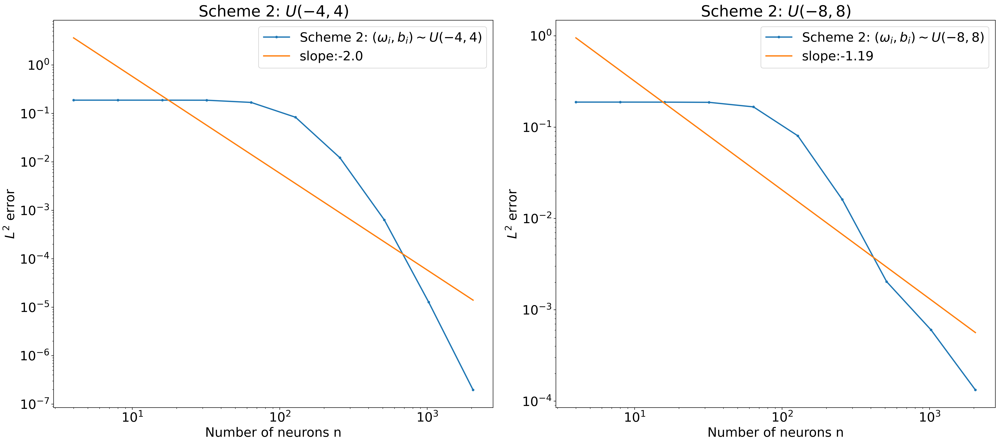

In [123]:
## gabor function 
def target(x):
    sigma = 0.15# s.d of Gaussian 
    frequency = 4  # frequency of cosine 
    z=  torch.exp( - ( (x[:,0:1] -0.5)**2 + ( x[:,1:2]-0.5)**2)  / (2*sigma**2)) *  torch.cos(2 * pi * frequency * x[:,0:1])
    # z=  torch.cos(2 * pi * frequency * x[:,0:1])  
    return z 

# def target(x):
#     return torch.sin(2 * pi*x[:,0:1])*torch.sin(4 * pi*x[:,1:2]) + torch.cos(8 * pi*x[:,0:1])*torch.sin(8 * pi*x[:,1:2])

Nx = 20   
order = 3 
integration_weights, integration_points = PiecewiseGQ2D_weights_points(Nx, order,[0,0],[1,1])
integration_weights_test, integration_points_test = PiecewiseGQ2D_weights_points(40, order,[0,0],[1,1])

save = False 
R_m_list = [4,8]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,12)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 2
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(2, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_sphere(my_model,R_m)
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            # print("shape of D: ", D.shape)
            # print("shape of b_rhs: ", b_rhs.shape) 
            # sol =  torch.linalg.lstsq(D,b_rhs).solution # driver='gelsd'
            # print("sol shape: ", sol.shape) 
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 2: $(\omega_i,b_i) \sim U(-{}, {})$".format(R_m,R_m)
    title = "Scheme 2: $U(-{}, {})$".format(R_m,R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

### 2D scheme 3 

In [38]:
import math 
def target(x):
    z = torch.sin(pi* x[:,0:1])*torch.sin(pi*x[:,1:2] )   
    return z

Nx = 20
order = 3 
integration_weights, integration_points = PiecewiseGQ2D_weights_points(Nx, order,[-1,-1],[1,1])
integration_weights_test, integration_points_test = PiecewiseGQ2D_weights_points(50, order,[-1,-1],[1,1])

save = False 
R_m_list = [0.5,1,2]
plt.rcParams.update({'font.size': 20})
# fig_layout = (math.ceil(len(R_m_list)/3), 3)
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,7)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,15)]) 
    for n in neuron_num_arr : 
        trial_num = 5
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(2, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_petrushev(my_model,R_m) 
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            
            # sol =  torch.linalg.lstsq(D,b_rhs,driver='gelsd').solution # driver='gelsd'
            # print("sol shape: ", sol.shape) 
            # D, b_rhs = rescale_mat_rhs(D,b_rhs)

            sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            # sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            # sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 3: Petrushev. R = {}".format(R_m)
    title = "Scheme 3: Petrushev R = {}".format(R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

/var/folders/45/p1_q2drx75983lk7ph_1gx6mhpr5_w/T/ipykernel_10085/2452784133.py:311: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  theta = torch.tensor(theta).to(device)
/var/folders/45/p1_q2drx75983lk7ph_1gx6mhpr5_w/T/ipykernel_10085/2452784133.py:334: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  biases = torch.tensor(biases).to(device)


### 2D scheme 4

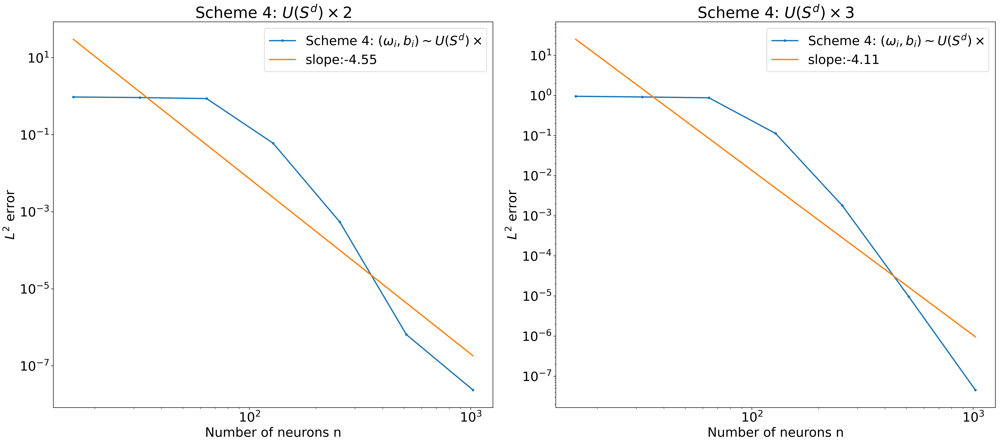

In [ ]:

def target(x):
    z = torch.sin(4*pi*x[:,0:1])*torch.sin(pi/2*x[:,1:2] )   
    return z

Nx = 20
order = 3 
integration_weights, integration_points = PiecewiseGQ2D_weights_points(Nx, order,[-1,-1],[1,1])
integration_weights_test, integration_points_test = PiecewiseGQ2D_weights_points(50, order,[-1,-1],[1,1])

save = False 
R_m_list = [2,3]
plt.rcParams.update({'font.size': 20})
# fig_layout = (math.ceil(len(R_m_list)/3), 3)
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(4,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,260,20)]) 
    for n in neuron_num_arr : 
        trial_num = 5
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(2, n, 1).to(device) 
            my_model = initialize_w_b_sphere(my_model,R_m) 
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 4: $(\omega_i,b_i) \sim U(S^d) \\times $".format(R_m)
    title = "Scheme 4: $U(S^d) \\times {}$".format(R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

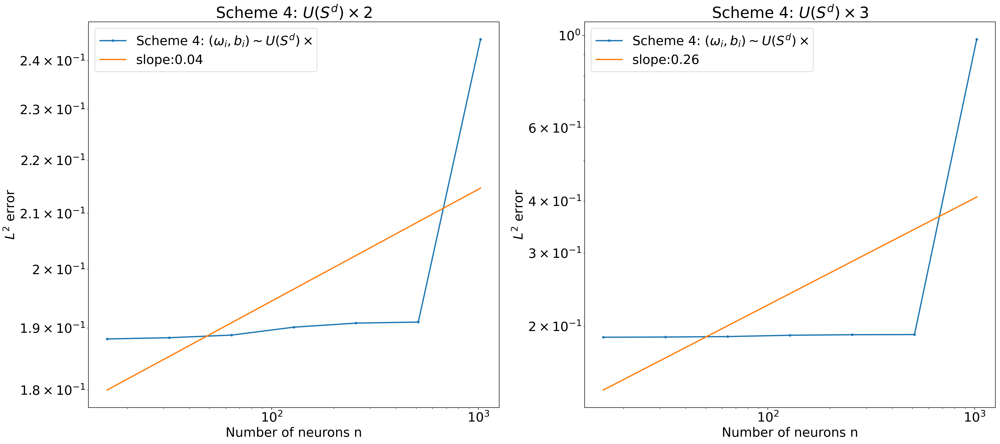

In [ ]:
## gabor function 
def target(x):
    sigma = 0.15# s.d of Gaussian 
    frequency = 8  # frequency of cosine 
    z=  torch.exp( - ( (x[:,0:1])**2 + ( x[:,1:2])**2)  / (2*sigma**2)) *  torch.cos(2 * pi * frequency * x[:,0:1])
    return z 


# def target(x):
#     z = torch.sin(4*pi*x[:,0:1])*torch.sin(pi/2*x[:,1:2] )   
#     return z

Nx = 20
order = 3 
integration_weights, integration_points = PiecewiseGQ2D_weights_points(Nx, order,[-1,-1],[1,1])
integration_weights_test, integration_points_test = PiecewiseGQ2D_weights_points(50, order,[-1,-1],[1,1])

save = False 
R_m_list = [2,3]
plt.rcParams.update({'font.size': 20})
# fig_layout = (math.ceil(len(R_m_list)/3), 3)
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32  
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(4,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,260,20)]) 
    for n in neuron_num_arr : 
        trial_num = 5
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(2, n, 1).to(device) 
            my_model = initialize_w_b_sphere(my_model,R_m) 
            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 

            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 4: $(\omega_i,b_i) \sim U(S^d) \\times $".format(R_m)
    title = "Scheme 4: $U(S^d) \\times {}$".format(R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

## 3D experiments 

### 3D scheme 1 

In [83]:
##1. exact solution: sin(pi/2 x)sin(pi/2 y) 
def u_exact(x): 
    z = torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3])  
    return z 
def u_x(x):
    z = (pi/2)*torch.cos(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3])  
    return z
def u_y(x):
    z = (pi/2)*torch.sin(pi/2*x[:,0:1])*torch.cos(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3])  
    return z 
def u_z(x):
    z = (pi/2)*torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.cos(pi/2*x[:,2:3])  
    return z 
def target(x):
    z = (3 * (pi/2)**2 + 1)*torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3]) 
    return z
def u_exact_grad(): 
    return [u_x, u_y, u_z]
 
Nx = 25   
order = 3 
integration_weights, integration_points = PiecewiseGQ3D_weights_points(Nx, order,[-1,-1,-1],[1,1,1])

integration_weights_test, integration_points_test =  PiecewiseGQ3D_weights_points(30, order,[-1,-1,-1],[1,1,1])

save = False 
R_m_list = [1,2,4]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32 
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 5 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(3, n, 1).to(device) 
            my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            # sol = minimize_linear_layer_explicit_assemble(my_model,target,weights, integration_points, solver="direct",activation='tanh')
            # my_model.fc2.weight.data[0,:] = sol[:]

            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            # print("shape of D: ", D.shape)
            # print("shape of b_rhs: ", b_rhs.shape) 
            sol =  torch.linalg.lstsq(D,b_rhs).solution # driver='gelsd'
            # print("sol shape: ", sol.shape) 
            my_model.fc2.weight.data[0,:] = sol.view(-1) 
            
            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
    
    legend1 = "Scheme 1: $(\omega_i,b_i) \sim U(-{}, {})$".format(R_m,R_m)
    title = "Scheme 1: $U(-{}, {})$".format(R_m,R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

In [ ]:
##1. exact solution: sin(pi/2 x)sin(pi/2 y) 
def u_exact(x): 
    z = torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3])  
    return z 
def u_x(x):
    z = (pi/2)*torch.cos(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3])  
    return z
def u_y(x):
    z = (pi/2)*torch.sin(pi/2*x[:,0:1])*torch.cos(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3])  
    return z 
def u_z(x):
    z = (pi/2)*torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.cos(pi/2*x[:,2:3])  
    return z 
def target(x):
    z = (3 * (pi/2)**2 + 1)*torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3]) 
    return z
def u_exact_grad(): 
    return [u_x, u_y, u_z]
 
Nx = 25   
order = 3 
integration_weights, integration_points = PiecewiseGQ3D_weights_points(Nx, order,[-1,-1,-1],[1,1,1])

integration_weights_test, integration_points_test =  PiecewiseGQ3D_weights_points(30, order,[-1,-1,-1],[1,1,1])

save = False 
R_m_list = [0.5,1,2]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32 
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 5 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(3, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_uniform(my_model,R_m) 
            # sol = minimize_linear_layer_explicit_assemble(my_model,target,weights, integration_points, solver="direct",activation='tanh')
            # my_model.fc2.weight.data[0,:] = sol[:]

            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            # print("shape of D: ", D.shape)
            # print("shape of b_rhs: ", b_rhs.shape) 
            sol =  torch.linalg.lstsq(D,b_rhs).solution # driver='gelsd'
            # print("sol shape: ", sol.shape) 
            my_model.fc2.weight.data[0,:] = sol.view(-1) 
            
            
            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
  
    legend1 = "Scheme 2: $(\omega_i,b_i) \sim U(-{}, {})$".format(R_m,R_m)
    title = "Scheme 2: $U(-{}, {})$".format(R_m,R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

### 3D scheme 3 

In [ ]:

def target(x):
    z = torch.sin(pi/2*x[:,0:1]) * torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3]) 
    return z
 
Nx = 20 
order = 3 
integration_weights, integration_points = PiecewiseGQ3D_weights_points(Nx, order,[-1,-1,-1],[1,1,1])

integration_weights_test, integration_points_test =  PiecewiseGQ3D_weights_points(30, order,[-1,-1,-1],[1,1,1])

save = False 
R_m_list = [1,2,4]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32 
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 5 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(3, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            my_model = initialize_w_b_petrushev(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            # sol = minimize_linear_layer_explicit_assemble(my_model,target,weights, integration_points, solver="direct",activation='tanh')
            # my_model.fc2.weight.data[0,:] = sol[:]

            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            # print("shape of D: ", D.shape)
            # print("shape of b_rhs: ", b_rhs.shape) 
            sol =  torch.linalg.lstsq(D,b_rhs).solution # driver='gelsd'
            # print("sol shape: ", sol.shape) 
            my_model.fc2.weight.data[0,:] = sol.view(-1) 
            
            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
    
    legend1 = "Scheme 3: Petrushev. R = {}".format(R_m)
    title = "Scheme 3: Petrushev R = {}".format(R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()

/var/folders/45/p1_q2drx75983lk7ph_1gx6mhpr5_w/T/ipykernel_23441/480780926.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  biases = torch.tensor(biases).to(device)


In [ ]:
### 

### 3D scheme 4 

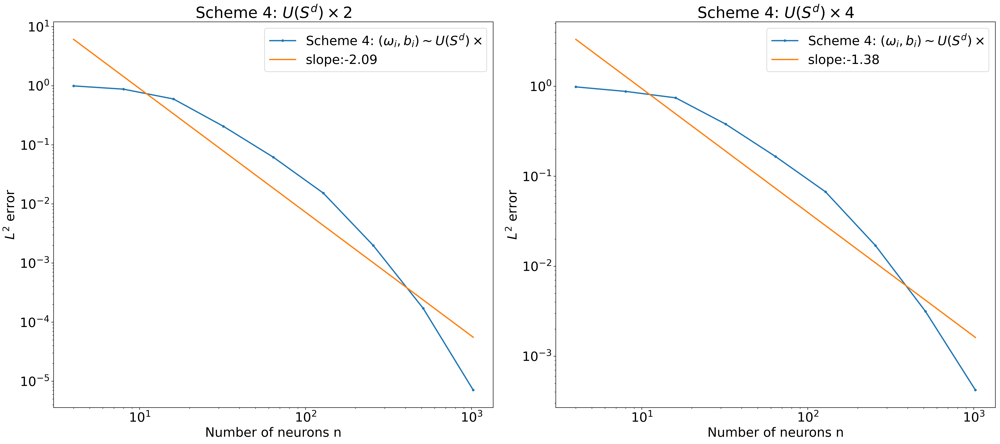

In [47]:
##1. exact solution: sin(pi/2 x)sin(pi/2 y) 
def target(x):
    z = torch.sin(pi/2*x[:,0:1])*torch.sin(pi/2*x[:,1:2] ) * torch.sin(pi/2*x[:,2:3]) 
    return z
def u_exact_grad(): 
    return [u_x, u_y, u_z]
 
Nx = 20 
order = 3 
integration_weights, integration_points = PiecewiseGQ3D_weights_points(Nx, order,[-1,-1,-1],[1,1,1])

integration_weights_test, integration_points_test =  PiecewiseGQ3D_weights_points(30, order,[-1,-1,-1],[1,1,1])

save = False 
R_m_list = [2,4]
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(1, len(R_m_list), figsize=(11*len(R_m_list), 10), dpi=400)
for ind, R_m in enumerate(R_m_list): #  1,2,4,8,16,32 
    mean_err_l2_list = [] 
    neuron_num_arr= np.array([2**i for i in range(2,11)]) 
    # neuron_num_arr= np.array([i for i in range(1,200,20)]) 
    for n in neuron_num_arr : 
        trial_num = 5 
        err_l2_trial = torch.zeros(trial_num) 
        for trial in range(trial_num):
            my_model = model_tanh(3, n, 1).to(device) 
            # my_model = initialize_w_sphere_b_uniform(my_model,R_m) 
            # my_model = initialize_w_b_petrushev(my_model,R_m) 
            my_model = initialize_w_b_sphere(my_model,R_m) 
            # my_model = initialize_w_b_uniform(my_model,R_m) 
            # sol = minimize_linear_layer_explicit_assemble(my_model,target,weights, integration_points, solver="direct",activation='tanh')
            # my_model.fc2.weight.data[0,:] = sol[:]

            D,b_rhs = assemble_least_square_linear_system_quadrature(my_model,target,integration_weights, integration_points)
            D, b_rhs = rescale_mat_rhs(D,b_rhs)

            # sol =  torch.linalg.lstsq(D,b_rhs).solution # ,driver='gelsd'
            sol = scipy.linalg.lstsq(D.numpy(),b_rhs.numpy())[0]
            sol =torch.tensor(sol)
            my_model.fc2.weight.data[0,:] = sol.view(-1) 
            
            with torch.no_grad(): 
                nn_func_values = my_model(integration_points_test) 
            target_values = target(integration_points_test) 

            diff_sqrd = (nn_func_values - target_values)**2 
            err_l2 = ( integration_weights_test.t() @ diff_sqrd )**0.5 
            err_l2_trial[trial] = err_l2 
        mean_err_l2 = torch.mean(err_l2_trial) 
        mean_err_l2_list.append(mean_err_l2) 
    mean_err_l2_arr = np.array(mean_err_l2_list) 
    if save: 
        data_uniform_distribution = np.concatenate([neuron_num_arr.reshape(-1,1),mean_err_l2_arr.reshape(-1,1)],axis = 1) 
        np.savetxt("2d_save_l2err_uniform_distribution_Rm_{}_trials_{}.txt".format(R_m, trial_num),data_uniform_distribution)
    
    legend1 = "Scheme 4: $(\omega_i,b_i) \sim U(S^d) \\times $".format(R_m)
    title = "Scheme 4: $U(S^d) \\times {}$".format(R_m) 
    # plt.figure(dpi = 400)
    ax = axes[ind]
    ax.plot(neuron_num_arr, mean_err_l2_arr, '.-', label = legend1, linewidth = 2)
    # plot a reference line and the slope
    log_M = np.log(neuron_num_arr)
    log_errors = np.log(mean_err_l2_arr)
    slope, intercept = np.polyfit(log_M, log_errors, 1)
    def line_of_best_fit(x):
        return np.exp(intercept) * (x ** slope)
    best_fit = line_of_best_fit(neuron_num_arr)
    ax.plot(neuron_num_arr, best_fit, label = "slope:{}".format(round(slope,2) ), linewidth = 2)

    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylabel("$L^2$ error")
    ax.set_xlabel("Number of neurons n")
    ax.set_title(title) 

plt.tight_layout()
plt.show()